# CA03 - Decision Tree Algorithm

Investigate the data and answer the following questions:
1. **Why does it makes sense to discretize columns for this problem?**
2. **What might be the issues (if any) if we DID NOT discretize the columns.**


*Note that the “continuous” data columns have been “transformed” into certain “data groups” or “data blocks”. This technique is called “binning” and by this process you can transform “continuous” data to “discrete categories”, because for certain applications like this “discrete categories” makes more sense that the exact value in the continuous scale. It’s also called “discretization” of data*

## 1. Data Source and Contents

The dataset is obtained from the Census Bureau and represents salaries of people along with seven demographic variables. The following is a description of our dataset:

* **Number of target classes:** 2 ('>50K' and '<=50K') [ Labels: 1, 0 ]
* **Number of attributes (Columns):** 7
* **Number of instances (Rows):** 48,842

In [1]:
# importing packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [2]:
# reading the data
census_data = pd.read_csv('/content/drive/MyDrive/MSBA_Colab_2020/ML_Algorithms/CA03/Data/census_data.csv')

In [3]:
# checking out the dataset
census_data.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


## 2. Data Quality Analysis (DQA)
* Perform a Data Quality Analysis to find missing values.
* Display descriptive statistics of each column

In [4]:
# 1. Perform a Data Quality Analysis to find missing values, outliers, NaNs etc.

census_data.isna().sum()

# there are no missing values in this dataset

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [5]:
# 2. Display descriptive statistics of each column

census_data.info()

# the dataset has 11 columns and 48842 rows. 
# all columns contain object datatypes, except for column 'y' (integer).

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


## 3. Exploratory Data Analysis (EDA)

Perform EDA of the income group with respect to the seven explanatory variables and display graphical representations.


*  less or equal to 50K = 0
*  greater than 50K = 1



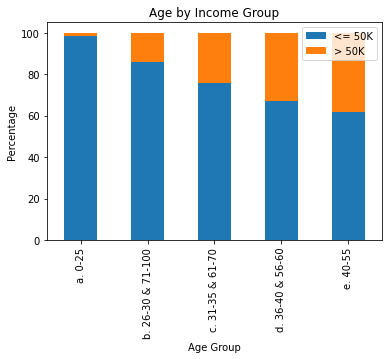

In [6]:
# 1. Age

# grouping income <= 50K by age
age0 = census_data[census_data.y ==0].groupby('age_bin')[['y']].count()
age0.reset_index(inplace=True)

# grouping income > 50K by age
age1 = census_data[census_data.y ==1].groupby('age_bin')[['y']].count()
age1.reset_index(inplace=True)

# grouping all income by age
age_all = census_data.groupby('age_bin')[['y']].count()
age_all.reset_index(inplace=True)

# merging groups
age_merge = pd.merge(age0, age1, on='age_bin', how='left')

#renaming columns for readability
age_merge = age_merge.rename(columns={'y_x':'<= 50K', 'y_y':'> 50K'})

# converting to percentages
age_merge['<= 50K'] = (age_merge['<= 50K'].div(age_all['y']))*100
age_merge['> 50K'] = (age_merge['> 50K'].div(age_all['y']))*100

# setting index to bins
age_merge.set_index('age_bin', inplace=True)

# plotting bar chart
age_merge.plot(
    kind='bar', 
    stacked=True, 
    title='Age by Income Group',
    xlabel='Age Group',
    ylabel='Percentage')

# displaying graph
plt.show()

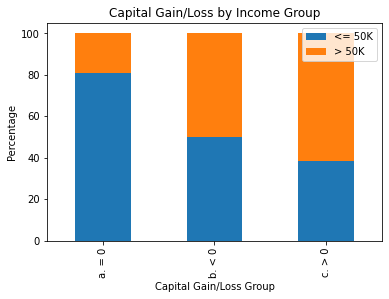

In [7]:
# 2. Capital Gain/Loss

# grouping income <= 50K by capital gain/loss
gl0 = census_data[census_data.y ==0].groupby('capital_gl_bin')[['y']].count()
gl0.reset_index(inplace=True)

# grouping income > 50K by age
gl1 = census_data[census_data.y ==1].groupby('capital_gl_bin')[['y']].count()
gl1.reset_index(inplace=True)

# grouping all income by capital gain/loss
gl_all = census_data.groupby('capital_gl_bin')[['y']].count()
gl_all.reset_index(inplace=True)

# merging groups
gl_merge = pd.merge(gl0, gl1, on='capital_gl_bin', how='left')

#renaming columns for readability
gl_merge = gl_merge.rename(columns={'y_x':'<= 50K', 'y_y':'> 50K'})

# converting to percentages
gl_merge['<= 50K'] = (gl_merge['<= 50K'].div(gl_all['y']))*100
gl_merge['> 50K'] = (gl_merge['> 50K'].div(gl_all['y']))*100

# setting index to bins
gl_merge.set_index('capital_gl_bin', inplace=True)

# plotting bar chart
gl_merge.plot(
    kind='bar', 
    stacked=True, 
    title='Capital Gain/Loss by Income Group',
    xlabel='Capital Gain/Loss Group',
    ylabel='Percentage')

# displaying graph
plt.show()

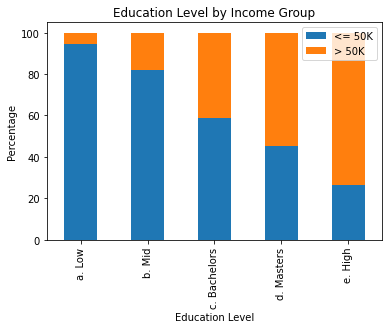

In [8]:
# 3. Education

# grouping income <= 50K by education
education0 = census_data[census_data.y ==0].groupby('education_bin')[['y']].count()
education0.reset_index(inplace=True)

# grouping income > 50K by age
education1 = census_data[census_data.y ==1].groupby('education_bin')[['y']].count()
education1.reset_index(inplace=True)

# grouping all income by age
education_all = census_data.groupby('education_bin')[['y']].count()
education_all.reset_index(inplace=True)

# merging groups
education_merge = pd.merge(education0, education1, on='education_bin', how='left')

#renaming columns for readability
education_merge = education_merge.rename(columns={'y_x':'<= 50K', 'y_y':'> 50K'})

# converting to percentages
education_merge['<= 50K'] = (education_merge['<= 50K'].div(education_all['y']))*100
education_merge['> 50K'] = (education_merge['> 50K'].div(education_all['y']))*100

# setting index to bins
education_merge.set_index('education_bin', inplace=True)

# plotting bar chart
education_merge.plot(
    kind='bar', 
    stacked=True, 
    title='Education Level by Income Group',
    xlabel='Education Level',
    ylabel='Percentage')

# displaying graph
plt.show()

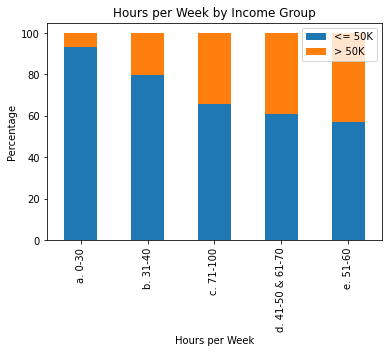

In [9]:
# 4. Hours per Week

# grouping income <= 50K by hours per week
hours0 = census_data[census_data.y ==0].groupby('hours_per_week_bin')[['y']].count()
hours0.reset_index(inplace=True)

# grouping income > 50K by age
hours1 = census_data[census_data.y ==1].groupby('hours_per_week_bin')[['y']].count()
hours1.reset_index(inplace=True)

# grouping all income by age
hours_all = census_data.groupby('hours_per_week_bin')[['y']].count()
hours_all.reset_index(inplace=True)

# merging groups
hours_merge = pd.merge(hours0, hours1, on='hours_per_week_bin', how='left')

#renaming columns for readability
hours_merge = hours_merge.rename(columns={'y_x':'<= 50K', 'y_y':'> 50K'})

# converting to percentages
hours_merge['<= 50K'] = (hours_merge['<= 50K'].div(hours_all['y']))*100
hours_merge['> 50K'] = (hours_merge['> 50K'].div(hours_all['y']))*100

# setting index to bins
hours_merge.set_index('hours_per_week_bin', inplace=True)

# plotting bar chart
hours_merge.plot(
    kind='bar', 
    stacked=True, 
    title='Hours per Week by Income Group',
    xlabel='Hours per Week',
    ylabel='Percentage')

# displaying graph
plt.show()

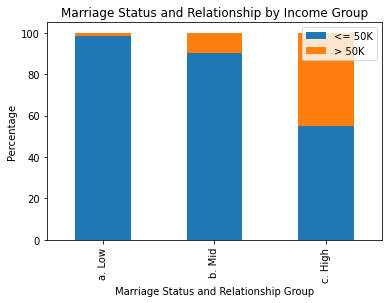

In [10]:
# 5. Marriage Status and Relationship

# grouping income <= 50K by hours per week
msr0 = census_data[census_data.y ==0].groupby('msr_bin')[['y']].count()
msr0.reset_index(inplace=True)

# grouping income > 50K by age
msr1 = census_data[census_data.y ==1].groupby('msr_bin')[['y']].count()
msr1.reset_index(inplace=True)

# grouping all income by age
msr_all = census_data.groupby('msr_bin')[['y']].count()
msr_all.reset_index(inplace=True)

# merging groups
msr_merge = pd.merge(msr0, msr1, on='msr_bin', how='left')

#renaming columns for readability
msr_merge = msr_merge.rename(columns={'y_x':'<= 50K', 'y_y':'> 50K'})

# converting to percentages
msr_merge['<= 50K'] = (msr_merge['<= 50K'].div(msr_all['y']))*100
msr_merge['> 50K'] = (msr_merge['> 50K'].div(msr_all['y']))*100

# setting index to bins
msr_merge.set_index('msr_bin', inplace=True)

# plotting bar chart
msr_merge.plot(
    kind='bar', 
    stacked=True, 
    title='Marriage Status and Relationship by Income Group',
    xlabel='Marriage Status and Relationship Group',
    ylabel='Percentage')

# displaying graph
plt.show()

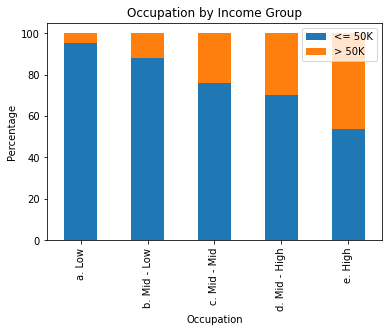

In [11]:
# 5. Occupation

# grouping income <= 50K by hours per week
occupation0 = census_data[census_data.y ==0].groupby('occupation_bin')[['y']].count()
occupation0.reset_index(inplace=True)

# grouping income > 50K by age
occupation1 = census_data[census_data.y ==1].groupby('occupation_bin')[['y']].count()
occupation1.reset_index(inplace=True)

# grouping all income by age
occupation_all = census_data.groupby('occupation_bin')[['y']].count()
occupation_all.reset_index(inplace=True)

# merging groups
occupation_merge = pd.merge(occupation0, occupation1, on='occupation_bin', how='left')

#renaming columns for readability
occupation_merge = occupation_merge.rename(columns={'y_x':'<= 50K', 'y_y':'> 50K'})

# converting to percentages
occupation_merge['<= 50K'] = (occupation_merge['<= 50K'].div(occupation_all['y']))*100
occupation_merge['> 50K'] = (occupation_merge['> 50K'].div(occupation_all['y']))*100

# setting index to bins
occupation_merge.set_index('occupation_bin', inplace=True)

# plotting bar chart
occupation_merge.plot(
    kind='bar', 
    stacked=True, 
    title='Occupation by Income Group',
    xlabel='Occupation',
    ylabel='Percentage')

# displaying graph
plt.show()

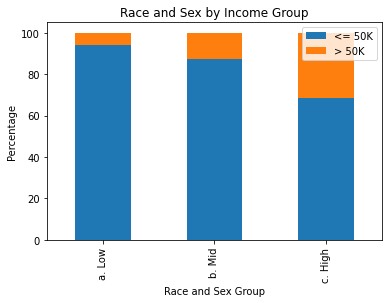

In [12]:
# 5. Race and Sex

# grouping income <= 50K by hours per week
race_sex0 = census_data[census_data.y ==0].groupby('race_sex_bin')[['y']].count()
race_sex0.reset_index(inplace=True)

# grouping income > 50K by age
race_sex1 = census_data[census_data.y ==1].groupby('race_sex_bin')[['y']].count()
race_sex1.reset_index(inplace=True)

# grouping all income by age
race_sex_all = census_data.groupby('race_sex_bin')[['y']].count()
race_sex_all.reset_index(inplace=True)

# merging groups
race_sex_merge = pd.merge(race_sex0, race_sex1, on='race_sex_bin', how='left')

#renaming columns for readability
race_sex_merge = race_sex_merge.rename(columns={'y_x':'<= 50K', 'y_y':'> 50K'})

# converting to percentages
race_sex_merge['<= 50K'] = (race_sex_merge['<= 50K'].div(race_sex_all['y']))*100
race_sex_merge['> 50K'] = (race_sex_merge['> 50K'].div(race_sex_all['y']))*100

# setting index to bins
race_sex_merge.set_index('race_sex_bin', inplace=True)

# plotting bar chart
race_sex_merge.plot(
    kind='bar', 
    stacked=True, 
    title='Race and Sex by Income Group',
    xlabel='Race and Sex Group',
    ylabel='Percentage')

# displaying graph
plt.show()

## 4. Build Decision Tree Classifier Models

Using the “DecisionTreeClassifier” algorithm from scikit learn

**Definition**: Given a data of attributes together with its classes, a decision tree produces a sequence of rules that can be used to classify the data.

**Advantages**: Decision Tree is simple to understand and visualise, requires little data preparation, and can handle both numerical and categorical data.

**Disadvantages**: Decision tree can create complex trees that do not generalize well, and decision trees can be unstable because small variations in the data might result in a completely different tree being generated.



In [13]:
# encoding categorical values
census_data_encoded = census_data.apply(LabelEncoder().fit_transform)

# flag: train = 1, test = 0

# seperating dataset into training (67%) and testing (33%) data
X_train = census_data_encoded[census_data_encoded.flag==1].drop(['flag','y'], axis=1)
X_test = census_data_encoded[census_data_encoded.flag==0].drop(['flag','y'], axis=1)

y_train = census_data_encoded[census_data_encoded.flag==1][['y']]
y_test = census_data_encoded[census_data_encoded.flag==0][['y']]

# verifying shapes (split ratio)
X_train.shape
X_test.shape
y_train.shape
y_test.shape

(16281, 1)

In [14]:
# decision tree classifyer syntax
dtree = DecisionTreeClassifier(max_depth=10, random_state=101,
                               max_features=None, min_samples_leaf=15)

# fitting the model
dtree.fit(X_train, y_train)

# predicting class of samples
y_pred = dtree.predict(X_test)

## 5. Visualize Your Decision Tree using GraphViz

Now that we have a decision tree, we can use the pydotplus package to create a visualization for it.

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.757916 to fit



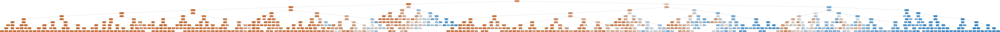

In [15]:
# creating visualization of the decision tree model
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 6. Evaluate Decision Tree Performance

Calculate and display the following:
* Confusion Matrix (TP, TN, FP, FN ... etc.)
* Accuracy, Precision, Recall, F1 Score, AUC Value, ROC Curve (graph)

In [16]:
# Confusion Matrix
pd.DataFrame(confusion_matrix(y_test, y_pred))

# out of 16,281 instances, the model misclassified 2,543.

,0,1
0,11607,828
1,1715,2131


In [17]:
# Confusion Matrix details
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
print(f'True Positives: {tp}')
print(f'False Positives: {fp}')
print(f'True Negatives: {tn}')
print(f'False Negatives: {fn}')

True Positives: 2131
False Positives: 828
True Negatives: 11607
False Negatives: 1715


In [18]:
# Accuracy score
accuracy_score(y_test, y_pred)

0.8438056630428107

In [19]:
# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.72      0.55      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.80      0.74      0.76     16281
weighted avg       0.84      0.84      0.84     16281



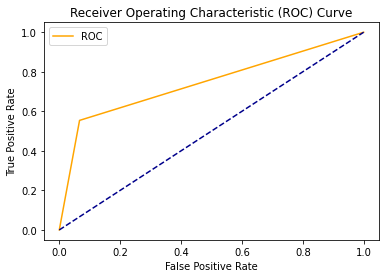

In [20]:
# ROC curve

# definiting plot
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

# defining inputs and plotting graph
probas = dtree.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr)

In [21]:
# AUC value
roc_auc_score(y_test, y_pred)

0.7437479573971861

## 7. Tune Decision Tree Performance

Try varying FOUR of the hyperparameters manually, as per the following table, and train / score your model for each set of these hyperparameters.
Record your Tree’s performance with respect to each of these sets of hyperparameters in the Model Performance section of the following table.

Four Hyperparameters to vary:
1. **Split Criteria** – ‘Entropy’ or ‘Gini Impurity’
2. **Minimum Sample Split** – Minimum number of records required in any node for a further split to be attempted
3. **Minimum Sample Leaf** – Minimum of samples in a leaf node to stop further
splitting (becomes a leaf node)
4. **Maximum Depth** – Maximum depth of the tree allowed
   
Based on the ranges of values you find in your Decision Tree for these hyperparameters, vary them by manually choosing your own reasonable values and manually running the program for each of the Hyper-parameter combinations. An Excel file for this table is provided (Tree Tuning Cases.xlsx).

In [22]:
# Variation 1
dtree1 = DecisionTreeClassifier(criterion='entropy', max_depth=30, min_samples_leaf=15, min_samples_split=2)

dtree1.fit(X_train, y_train)
y_pred = dtree1.predict(X_test)

print('Classification report of variation 1:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 1:

              precision    recall  f1-score   support

           0   0.873816  0.927222  0.899727     12435
           1   0.706740  0.567083  0.629256      3846

    accuracy                       0.842147     16281
   macro avg   0.790278  0.747152  0.764491     16281
weighted avg   0.834348  0.842147  0.835834     16281



In [23]:
# Variation 2
dtree2 = DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=15, min_samples_split=2)

dtree2.fit(X_train, y_train)
y_pred = dtree2.predict(X_test)

print('Classification report of variation 2:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 2:

              precision    recall  f1-score   support

           0   0.872834  0.931725  0.901319     12435
           1   0.717659  0.561102  0.629797      3846

    accuracy                       0.844174     16281
   macro avg   0.795246  0.746414  0.765558     16281
weighted avg   0.836178  0.844174  0.837178     16281



In [24]:
# Variation 3
dtree3 = DecisionTreeClassifier(criterion='entropy', max_depth=30, min_samples_leaf=100, min_samples_split=2)

dtree3.fit(X_train, y_train)
y_pred = dtree3.predict(X_test)

print('Classification report of variation 3:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 3:

              precision    recall  f1-score   support

           0   0.868721  0.931805  0.899158     12435
           1   0.711859  0.544722  0.617175      3846

    accuracy                       0.840366     16281
   macro avg   0.790290  0.738264  0.758166     16281
weighted avg   0.831666  0.840366  0.832546     16281



In [25]:
# Variation 4
dtree4 = DecisionTreeClassifier(criterion='entropy', max_depth=30, min_samples_leaf=15, min_samples_split=200)

dtree4.fit(X_train, y_train)
y_pred = dtree4.predict(X_test)

print('Classification report of variation 4:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 4:

              precision    recall  f1-score   support

           0   0.872987  0.933012  0.902002     12435
           1   0.721498  0.561102  0.631271      3846

    accuracy                       0.845157     16281
   macro avg   0.797243  0.747057  0.766636     16281
weighted avg   0.837201  0.845157  0.838048     16281



In [26]:
# Variation 5
dtree5 = DecisionTreeClassifier(criterion='gini', max_depth=30, min_samples_leaf=15, min_samples_split=2)

dtree5.fit(X_train, y_train)
y_pred = dtree5.predict(X_test)

print('Classification report of variation 5:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 5:

              precision    recall  f1-score   support

           0   0.873005  0.928187  0.899751     12435
           1   0.708170  0.563443  0.627570      3846

    accuracy                       0.842024     16281
   macro avg   0.790588  0.745815  0.763660     16281
weighted avg   0.834067  0.842024  0.835454     16281



In [27]:
# Variation 6
dtree6 = DecisionTreeClassifier(criterion='gini', max_depth=10, min_samples_leaf=15, min_samples_split=2)

dtree6.fit(X_train, y_train)
y_pred = dtree6.predict(X_test)

print('Classification report of variation 6:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 6:

              precision    recall  f1-score   support

           0   0.871266  0.933414  0.901270     12435
           1   0.720176  0.554082  0.626304      3846

    accuracy                       0.843806     16281
   macro avg   0.795721  0.743748  0.763787     16281
weighted avg   0.835574  0.843806  0.836316     16281



In [28]:
# Variation 7
dtree7 = DecisionTreeClassifier(criterion='gini', max_depth=30, min_samples_leaf=100, min_samples_split=2)

dtree7.fit(X_train, y_train)
y_pred = dtree7.predict(X_test)

print('Classification report of variation 7:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 7:

              precision    recall  f1-score   support

           0   0.868945  0.930438  0.898641     12435
           1   0.708361  0.546282  0.616853      3846

    accuracy                       0.839690     16281
   macro avg   0.788653  0.738360  0.757747     16281
weighted avg   0.831011  0.839690  0.832075     16281



In [29]:
# Variation 8
dtree8 = DecisionTreeClassifier(criterion='gini', max_depth=30, min_samples_leaf=15, min_samples_split=200)

dtree8.fit(X_train, y_train)
y_pred = dtree8.predict(X_test)

print('Classification report of variation 8:\n')
print(classification_report(y_test, y_pred, digits=6))

Classification report of variation 8:

              precision    recall  f1-score   support

           0   0.874066  0.931001  0.901636     12435
           1   0.717391  0.566303  0.632956      3846

    accuracy                       0.844850     16281
   macro avg   0.795728  0.748652  0.767296     16281
weighted avg   0.837055  0.844850  0.838166     16281



## 8. Conclusion
Explain your observations from the above performance tuning effort.
1. How long was your total run time to train the model? 
2. Did you find the BEST TREE?
3. Draw the Graph of the BEST TREE Using GraphViz 
4. What makes it the best tree?

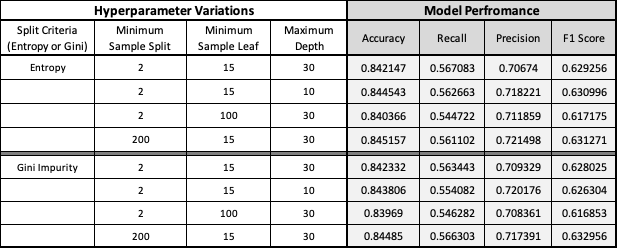

In [30]:
# 1. total run time to train best model
%time
best_dtree = DecisionTreeClassifier(criterion='gini', max_depth=30, min_samples_leaf=15, min_samples_split=200)
best_dtree.fit(X_train, y_train)
y_pred = best_dtree.predict(X_test)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


In [31]:
# 2. the decision tree with the best performance scores was variation 8

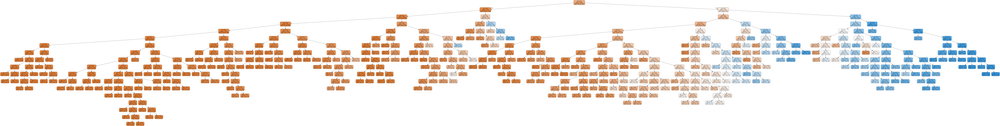

In [32]:
# 3. best decision tree graph
dot_data = StringIO()
export_graphviz(best_dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [33]:
# 4. tree variation #8 was the best decision tree as its classification report returned the highest scores on average 

## 9. Automation of Performance Tuning

Can you “automate” generation of the above “Hyperparameter Vs. Model Performance Table” in your code itself and display the table in your Notebook?

In [34]:
# defining function

def decision_tree_automation(criterion,min_samples_split,min_samples_leaf,max_depth):
  dtree_automate = DecisionTreeClassifier(
      criterion=criterion, 
      min_samples_split=min_samples_split, 
      min_samples_leaf=min_samples_leaf, 
      max_depth=max_depth)
  
  dtree_automate.fit(X_train, y_train)
  y_pred = dtree_automate.predict(X_test)

  data = [{'Split Criteria (Entropy or Gini)':criterion,
          'Minimum Sample Split':min_samples_split,
          'Minimum Sample Leaf':min_samples_leaf,
          'Maximum Depth':max_depth,
          'Accuracy':accuracy_score(y_test, y_pred),
          'Recall':recall_score(y_test, y_pred),
          'Precision':precision_score(y_test, y_pred),
          'F1 Score':f1_score(y_test, y_pred)}]
  
  results = pd.DataFrame(data)
  return results

In [35]:
# populating table

e1 = decision_tree_automation('entropy', 2, 15, 30)
e2 = decision_tree_automation('entropy', 2, 15, 10)
e3 = decision_tree_automation('entropy', 2, 100,30)
e4 = decision_tree_automation('entropy', 200,15,30)

g1 = decision_tree_automation('gini', 2, 15, 30)
g2 = decision_tree_automation('gini', 2, 15, 10)
g3 = decision_tree_automation('gini', 2, 100, 30)
g4 = decision_tree_automation('gini', 200,15,30)

dtree_result = pd.concat([e1,e2,e3,e4,g1,g2,g3,g4])
dtree_result

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,entropy,2,15,30,0.842147,0.567083,0.706740,0.629256
0,entropy,2,15,10,0.844174,0.561102,0.717659,0.629797
0,entropy,2,100,30,0.840366,0.544722,0.711859,0.617175
0,entropy,200,15,30,0.845157,0.561102,0.721498,0.631271
0,gini,2,15,30,0.842024,0.563443,0.708170,0.627570
0,gini,2,15,10,0.844174,0.555642,0.720742,0.627514
0,gini,2,100,30,0.839690,0.546282,0.708361,0.616853
0,gini,200,15,30,0.844850,0.566303,0.717391,0.632956


## 10. Prediction using your “trained” Decision Tree Model

Based on the Performance Tuning effort in the previous section, pick the best performing tree.
Now make a prediction of a "new" individual's Income Category (<=50K, or >50K ) with the following information. 
* Hours Worked per Week = 48
* Occupation Category = Mid - Low
* Marriage Status & Relationships = High
* Capital Gain = Yes
* Race-Sex Group = Mid
* Number of Years of Education = 12
* Education Category = High
* Work Class = Income
* Age=58
 
 
What is the probability that your prediction for this person is accurate?

In [38]:
# creating and appending new record
new_record = {'hours_per_week_bin':3, 'occupation_bin':1, 'msr_bin':2, 'capital_gl_bin':2, 'race_sex_bin':1, 'education_num_bin':1, 'education_bin':4, 'workclass_bin':1, 'age_bin':3}
census_data_encoded.append(new_record, ignore_index=True)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,3.0,1.0,0.0
1,0.0,4.0,2.0,0.0,2.0,2.0,2.0,1.0,4.0,1.0,0.0
2,1.0,0.0,1.0,0.0,2.0,1.0,1.0,1.0,3.0,1.0,0.0
3,1.0,0.0,2.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,0.0
4,1.0,4.0,2.0,0.0,0.0,2.0,2.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
48838,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,2.0,0.0,0.0
48839,3.0,4.0,2.0,0.0,2.0,2.0,2.0,1.0,3.0,0.0,0.0
48840,1.0,1.0,0.0,2.0,2.0,2.0,2.0,1.0,4.0,0.0,0.0
48841,4.0,4.0,2.0,0.0,2.0,2.0,2.0,1.0,2.0,0.0,1.0


In [44]:
# making prediction
X_train1 = census_data_encoded[census_data_encoded.flag==1].drop(['flag','y'], axis=1)
X_test1 = census_data_encoded[census_data_encoded.flag==0].drop(['flag','y'], axis=1)

y_train1 = census_data_encoded[census_data_encoded.flag==1][['y']]
y_test1 = census_data_encoded[census_data_encoded.flag==0][['y']]

best_dtree.fit(X_train1, y_train1)

y_pred1 = best_dtree.predict(X_test1)

print(classification_report(y_test1, y_pred1, digits=6))

# the probability that this prediction is accurate is about 84.5%

              precision    recall  f1-score   support

           0   0.874066  0.931001  0.901636     12435
           1   0.717391  0.566303  0.632956      3846

    accuracy                       0.844850     16281
   macro avg   0.795728  0.748652  0.767296     16281
weighted avg   0.837055  0.844850  0.838166     16281

